Checking Data

In [21]:
import pandas as pd

# path = r"C:\Users\Ehsan\Documents\Disertation\Word - June to\stock-market\Part4\All Ficnal data.xlsx"
path = 'https://raw.githubusercontent.com/ehsanh123/stock_market_prediction/main/Part4/Financial%20Repors/All%20Ficnal%20data.xlsx'

data = pd.read_excel(path)
# df1 = load_data(path)

excel_file = pd.ExcelFile(path)
Comapnies = excel_file.sheet_names

In [22]:
Mark1 = pd.read_excel(excel_file, sheet_name='Marks & Spencer')
JD  = pd.read_excel(excel_file, sheet_name='JD sports')
ASOS = pd.read_excel(excel_file, sheet_name='Associated British Foods')
Next = pd.read_excel(excel_file, sheet_name='Next')
Ocado = pd.read_excel(excel_file, sheet_name='Ocado')
Tesco = pd.read_excel(excel_file, sheet_name='Tesco')
Sainsbury = pd.read_excel(excel_file, sheet_name='SaintBury\'s')
king = pd.read_excel(excel_file, sheet_name='King Fisher')

Mark= king.copy()

In [23]:
# Columns = Mark.columns

half_cloumns = [#'Year', 
                'Revenue', 'Operating Profit', #'Operating Margin (%)',
       'Profit Before Tax ', 'Profit After Tax', #'Profit Margin (%)',
       'Basic ESP', 
       # 'Total Equity', 
       # 'Net Cash', 
       #'Debt-to-Equity(%)',
       'Interim Dividend', 
        # 'Free Cash Flow'
       ]
Columns = [#'Year', 
       'Revenue', 'Operating Profit', 'Operating Margin (%)',
       'Profit Before Tax ', 'Profit After Tax', 'Profit Margin (%)',
       'Basic ESP', 
       'Total Equity', 
       'Net Cash', 
       'Debt-to-Equity(%)',
       'Interim Dividend', 
       'Free Cash Flow'
       ]

In [24]:
for idx, row in Mark.iterrows():
    y1 = row['Year']
    # y1 = y1.astype(str)
    # if type(y1) != int and type(y1) != float:
    if y1 % 1 != 0:
            for col in half_cloumns:
                Mark.at[idx, col ] = row[col] * 2

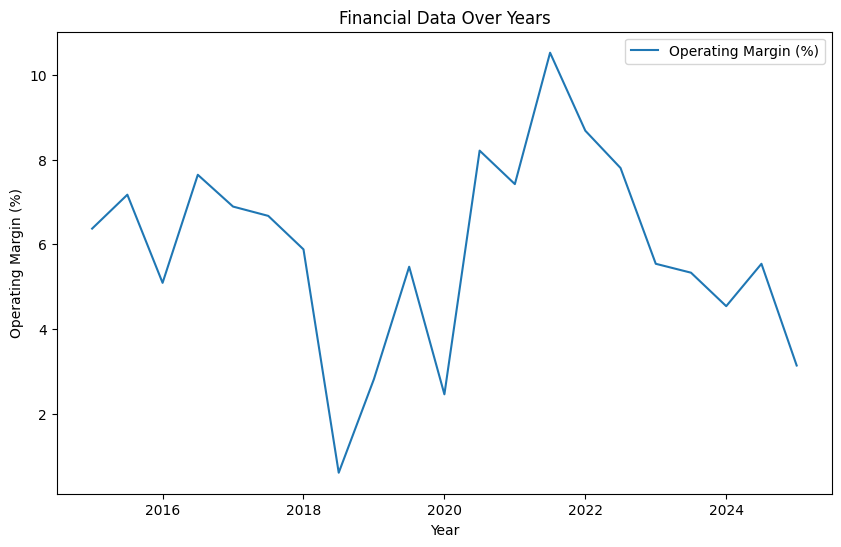

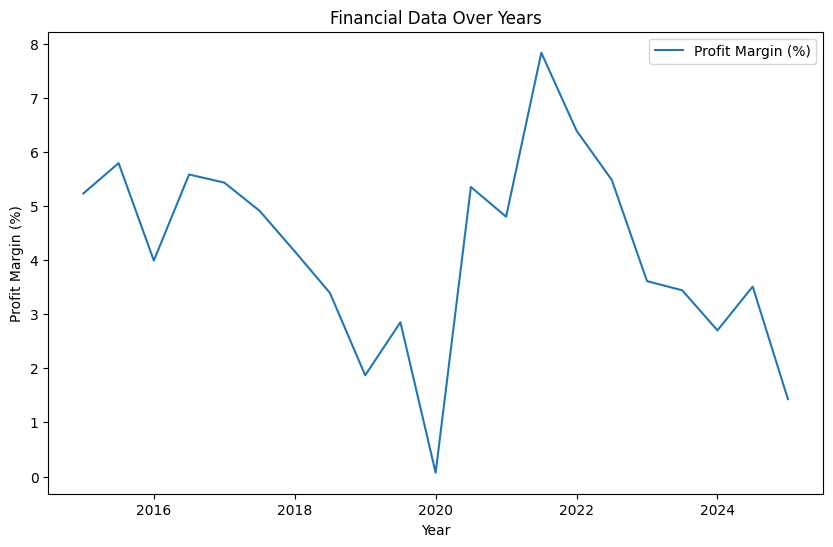

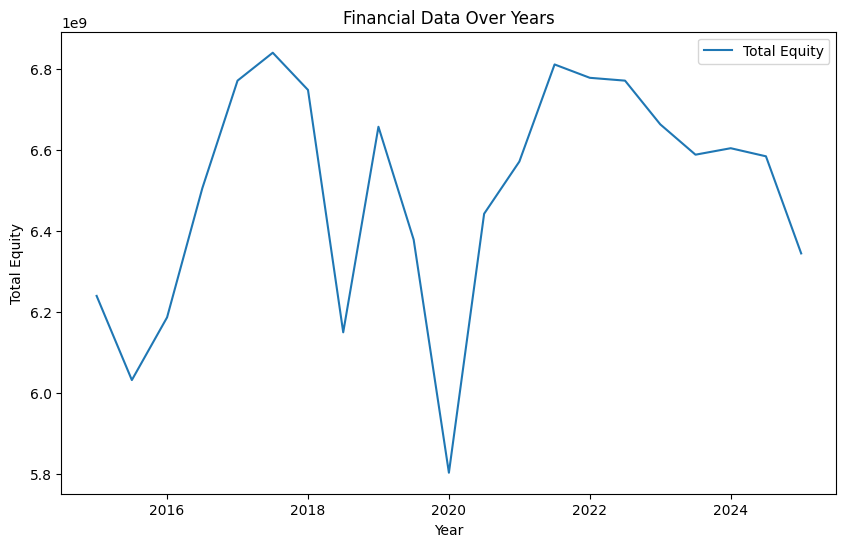

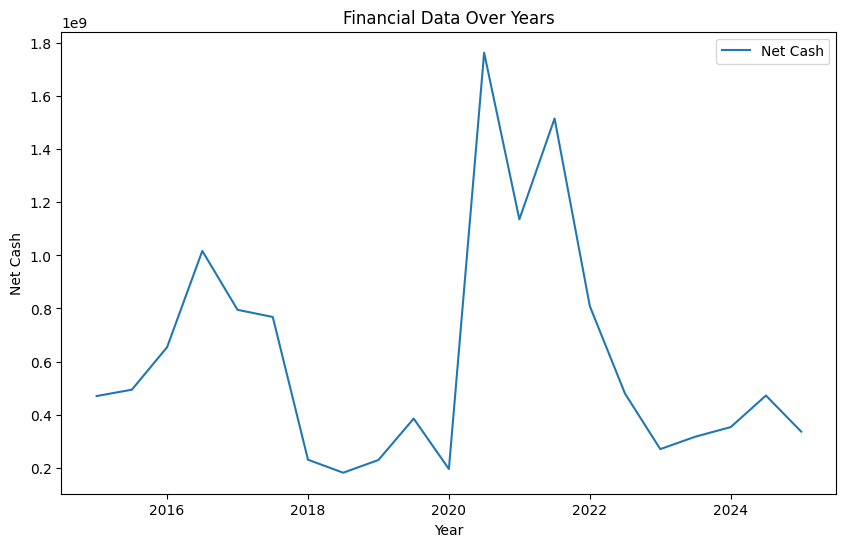

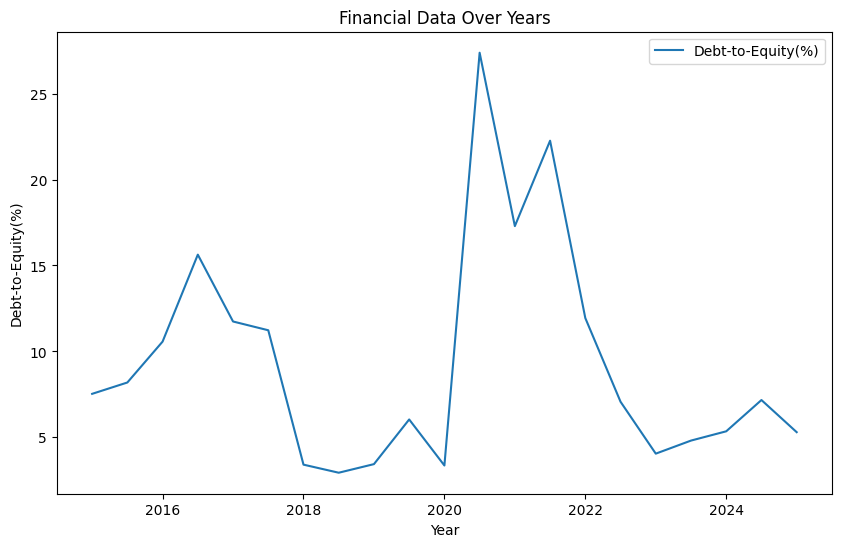

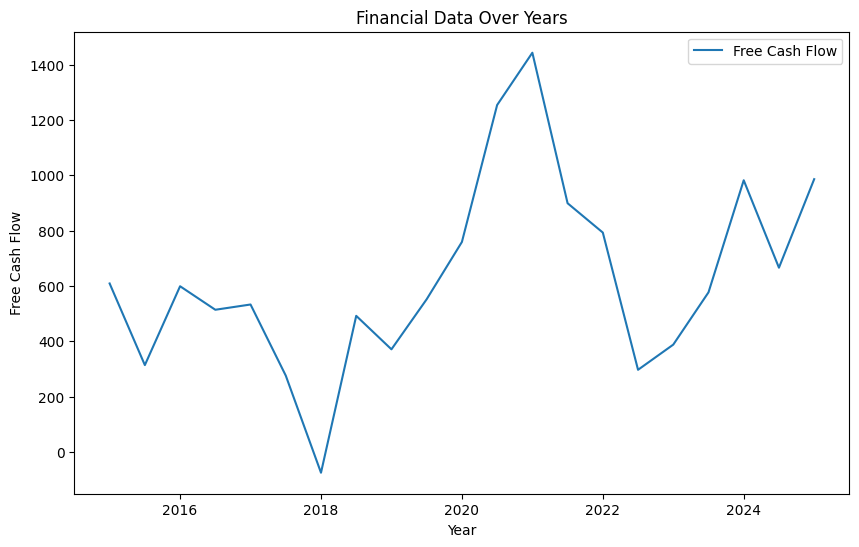

In [25]:
import matplotlib.pyplot as plt
import seaborn as sns
for id in Columns:
    if id in half_cloumns:
        continue
    plt.figure(figsize=(10, 6))
    # sns.lineplot(data=Mark, x='Year' , y = id, label=id)
    sns.lineplot(data=Mark, x='Year' , y = id, label=id)
    plt.title('Financial Data Over Years')
    plt.xlabel('Year')
    # plt.ylabel('£ million')
    plt.legend()
    
    plt.show()

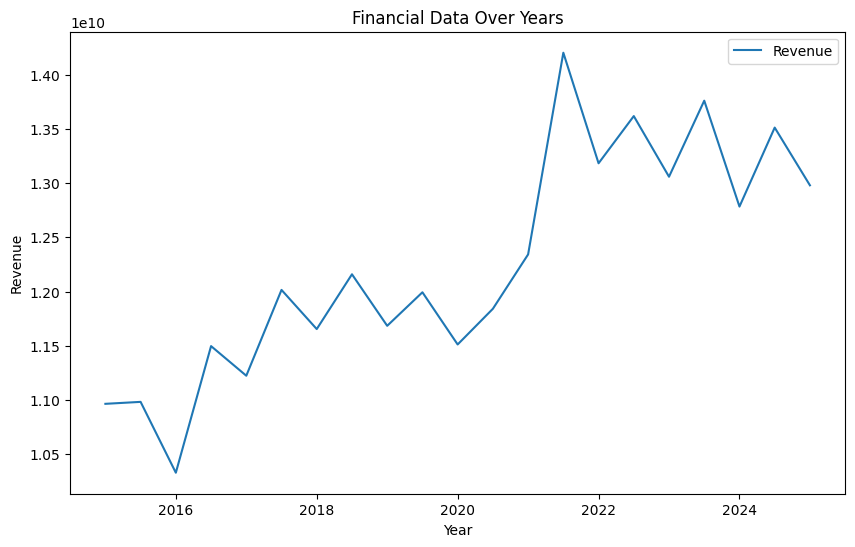

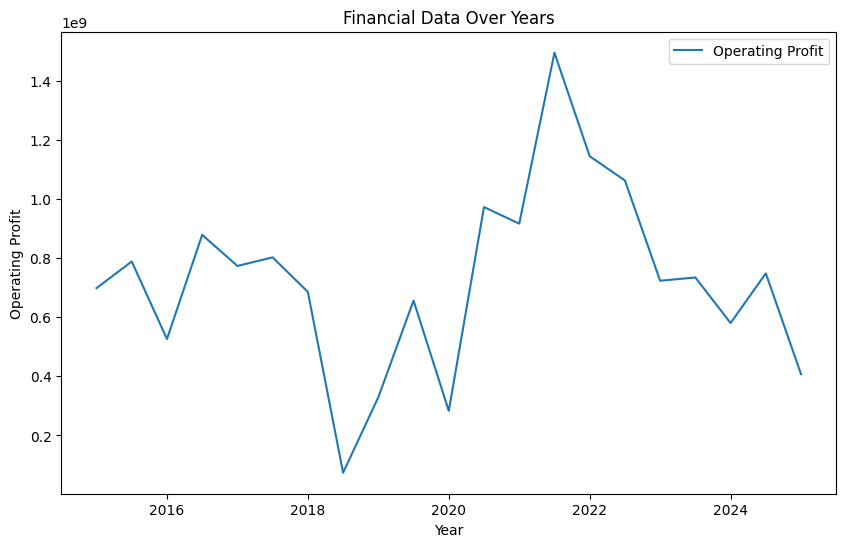

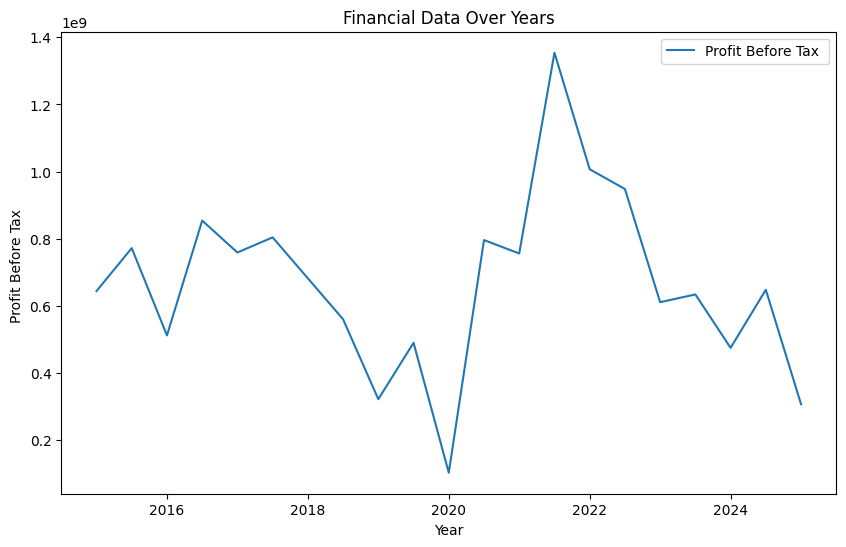

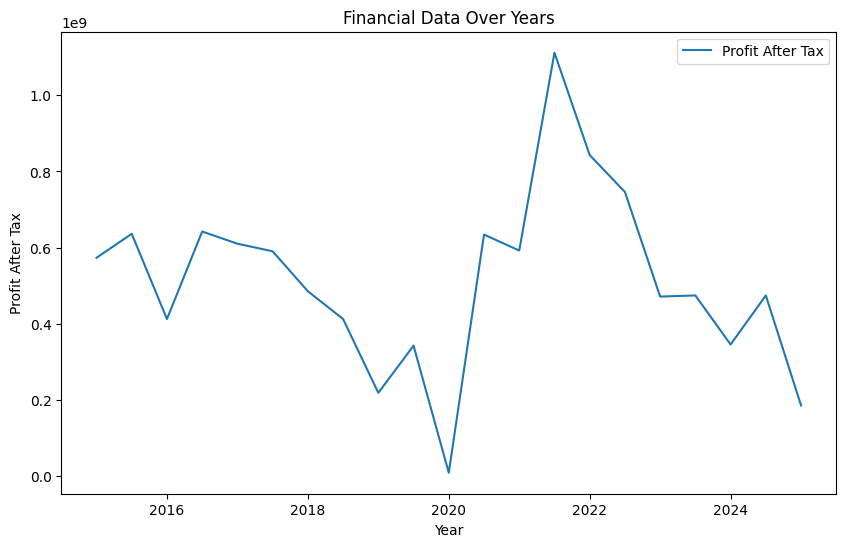

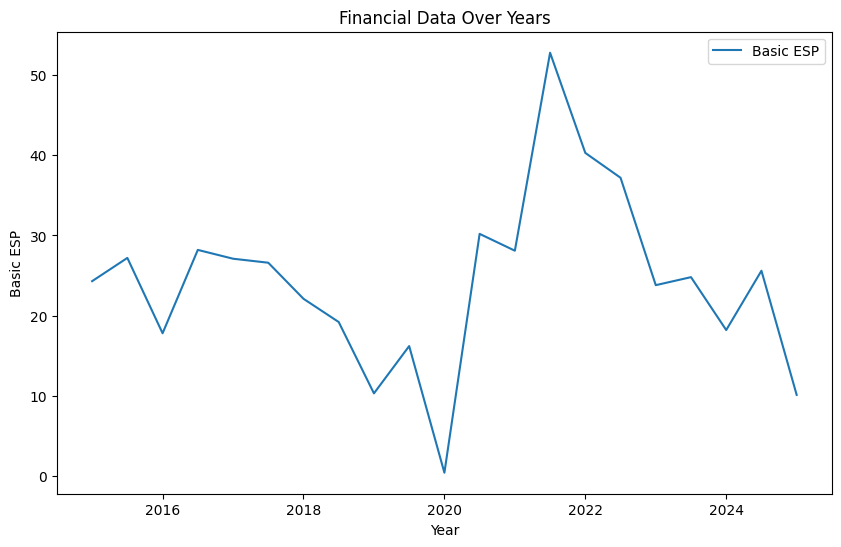

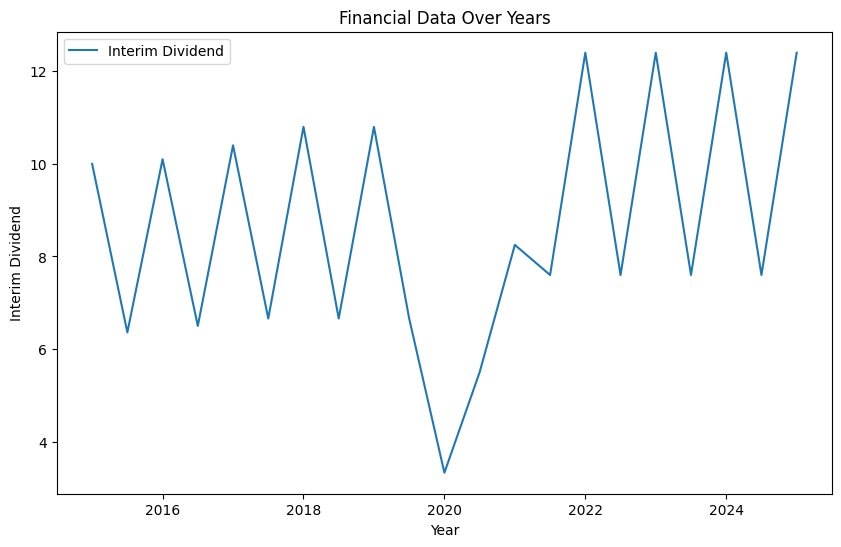

In [26]:
for id in Columns:
    if id not in half_cloumns:
        continue
    plt.figure(figsize=(10, 6))
    # sns.lineplot(data=Mark, x='Year' , y = id, label=id)
    sns.lineplot(data=Mark, x='Year' , y = id, label=id)
    plt.title('Financial Data Over Years')
    plt.xlabel('Year')
    # plt.ylabel('£ million')
    plt.legend()
    
    plt.show()

Getting Average Closing vale for period

In [27]:
import pandas as pd
import yfinance as yf
ids = ['TSCO.L', 'MKS.L', 'JD.L', 'ABF.L', 
       'NXT.L', 'OCDO.L', 'SBRY.L', 'KGF.L']
# 1. Download monthly close prices
num = 7
ticker = yf.Ticker(ids[num])
df = ticker.history(period="11y", interval="1d")[['Close']]
print(f'Checking the data for {ids[num]}')


Checking the data for KGF.L


In [28]:
# 2. Assign half-year period label: H1 for Jan–Jun, H2 for Jul–Dec
df['Month'] = df.index.month
df['Year'] = df.index.year
df['Half'] = df['Month'].apply(lambda m: 1 if 1 <= m <= 6 else 2)
df['Year_Half'] = df['Year'].astype(str) + '-H' + df['Half'].astype(str)

# 3. Group by Year_Half and compute average closing price
half_avg = df.groupby('Year_Half')['Close'].mean().reset_index()
half_avg.columns = ['Period', 'Avg_Close_Price']
print(half_avg)

     Period  Avg_Close_Price
0   2014-H2       305.858450
1   2015-H1       353.567934
2   2015-H2       351.715702
3   2016-H1       348.087272
4   2016-H2       354.098883
5   2017-H1       330.050642
6   2017-H2       307.497670
7   2018-H1       320.547508
8   2018-H2       262.555451
9   2019-H1       231.123008
10  2019-H2       208.807307
11  2020-H1       183.713808
12  2020-H2       273.516030
13  2021-H1       319.124498
14  2021-H2       346.890427
15  2022-H1       279.780265
16  2022-H2       237.214180
17  2023-H1       257.904361
18  2023-H2       227.217433
19  2024-H1       239.588446
20  2024-H2       282.343602
21  2025-H1       264.031531
22  2025-H2       281.094736


In [29]:
print("Average closing prices for the second half of each year:")
for idx, row in half_avg.iterrows():
    if 'H2' in row['Period']:
        print(f"{row['Avg_Close_Price']:.2f}")#, end= ' , ')

print(" ")
print("Average closing prices for the first half of each year:")
for idx, row in half_avg.iterrows():
    if 'H1' in row['Period']:
        print(f"{row['Avg_Close_Price']:.2f}")# , end= ' , ')

Average closing prices for the second half of each year:
305.86
351.72
354.10
307.50
262.56
208.81
273.52
346.89
237.21
227.22
282.34
281.09
 
Average closing prices for the first half of each year:
353.57
348.09
330.05
320.55
231.12
183.71
319.12
279.78
257.90
239.59
264.03


Preprocessing the data

1- Combining Datasets

In [30]:
import pandas as pd

path = r"C:\Users\Ehsan\Documents\Disertation\Word - June to\stock-market\Part4\All Ficnal data.xlsx"
data = pd.read_excel(path)
# df1 = load_data(path)

excel_file = pd.ExcelFile(path)
Comapnies = excel_file.sheet_names

Mark1 = pd.read_excel(excel_file, sheet_name='Marks & Spencer')
JD  = pd.read_excel(excel_file, sheet_name='JD sports')
ASOS = pd.read_excel(excel_file, sheet_name='Associated British Foods')
Next = pd.read_excel(excel_file, sheet_name='Next')
Ocado = pd.read_excel(excel_file, sheet_name='Ocado')
Tesco = pd.read_excel(excel_file, sheet_name='Tesco')
Sainsbury = pd.read_excel(excel_file, sheet_name='SaintBury\'s')
king = pd.read_excel(excel_file, sheet_name='King Fisher')

Mark1['Company'] = 'Marks & Spencer'
JD['Company'] = 'JD sports'
ASOS['Company'] = 'Associated British Foods'
Next['Company'] = 'Next'
Ocado['Company'] = 'Ocado'
Tesco['Company'] = 'Tesco'
Sainsbury['Company'] = "SaintBury's"
king['Company'] = 'King Fisher'

In [31]:
Data = pd.concat([Mark1, JD, ASOS, Next, Ocado, Tesco, Sainsbury, king], ignore_index=True)
Data1 = Data.copy()
Data.sample(5)

,Year,Revenue,Operating Profit,Operating Margin (%),Profit Before Tax,Profit After Tax,Profit Margin (%),Basic ESP,Total Equity,Net Cash,Debt-to-Equity(%),Interim Dividend,Free Cash Flow,Avg Close Price,Net From Oprating,CapEx,CEO Change,Company
118,2017.5,31734000000,1007000000,3.17,463000000,338000000,1.07,3.49,12928000000,3243000000,25.09,1.67,662.0,236.00,1189.0,527.0,0,Tesco
76,2017.5,1902300000,325200000,17.10,309400000,252200000,13.26,176.90,430100000,181800000,42.27,53.00,270.0,4094.95,321.9,51.9,0,Next
63,2015.0,4150000000,812100000,19.57,794800000,634900000,15.30,442.50,312000000,272700000,87.40,158.00,637.2,6686.27,743.2,106.0,0,Next
109,2019.0,63911000000,2153000000,3.37,1674000000,1320000000,2.07,13.65,14834000000,2916000000,19.66,5.77,823.0,289.00,1966.0,1143.0,0,Tesco
23,2017.0,2378700000,246200000,10.35,238400000,184580000,7.76,18.38,578842000,234335000,40.48,1.55,55.9,57.38,279.2,223.3,0,JD sports


In [32]:
Data.columns

Index(['Year', 'Revenue', 'Operating Profit', 'Operating Margin (%)',
       'Profit Before Tax ', 'Profit After Tax', 'Profit Margin (%)',
       'Basic ESP', 'Total Equity', 'Net Cash', 'Debt-to-Equity(%)',
       'Interim Dividend', 'Free Cash Flow', 'Avg Close Price',
       'Net From Oprating', 'CapEx', 'CEO Change', 'Company'],
      dtype='object')

2-Balancing half year and full year reports

In [33]:
Columns = [#'Year', 
           'Revenue', 'Operating Profit', 'Operating Margin (%)',
       #'Profit Before Tax ', 
       'Profit After Tax', 'Profit Margin (%)',
       'Basic ESP', 'Total Equity', 'Net Cash', 'Debt-to-Equity(%)',
       'Interim Dividend', 'Free Cash Flow', 'Avg Close Price',
       'Net From Oprating', 'CapEx', 'CEO Change', #'Company'
       ]
Double_Columns = [#'Year', 
    'Revenue', 'Operating Profit', #'Operating Margin (%)',
    #'Profit Before Tax ', 
    'Profit After Tax', #'Profit Margin (%)',
    'Basic ESP', #'Total Equity', 'Net Cash','Debt-to-Equity(%)',
    'Interim Dividend', #'Free Cash Flow', 'Avg Close Price',
    'Net From Oprating', 'CapEx', #'Company'
    ]

for idx, row in Data.iterrows():
    y1 = row['Year']
    if y1 % 1 != 0:
            for col in Double_Columns:
                Data1.at[idx, col ] = row[col] * 2

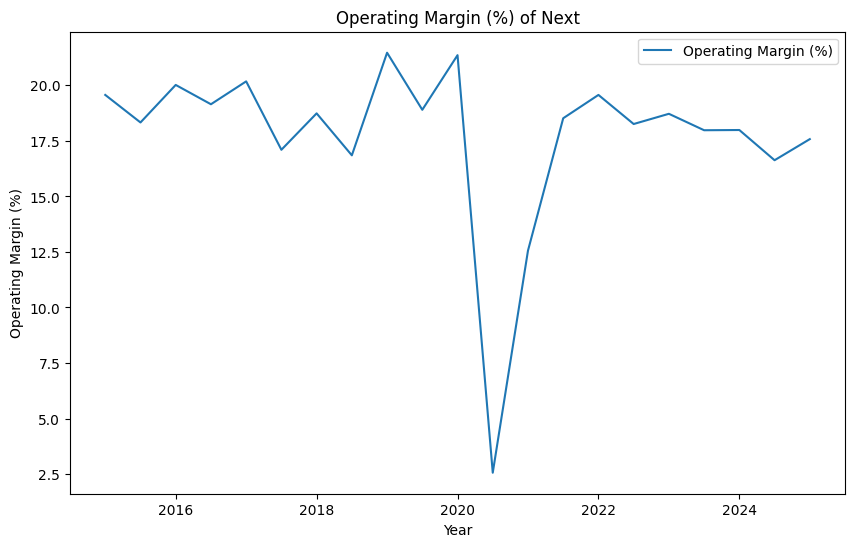

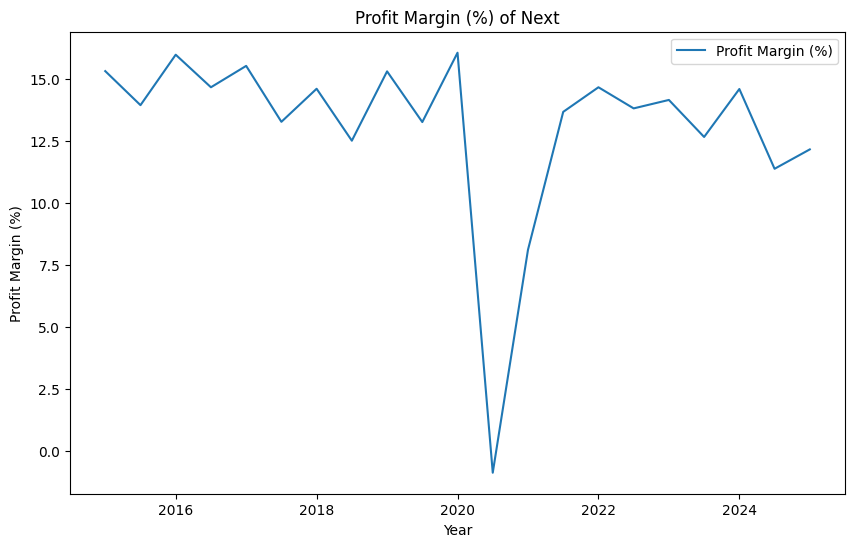

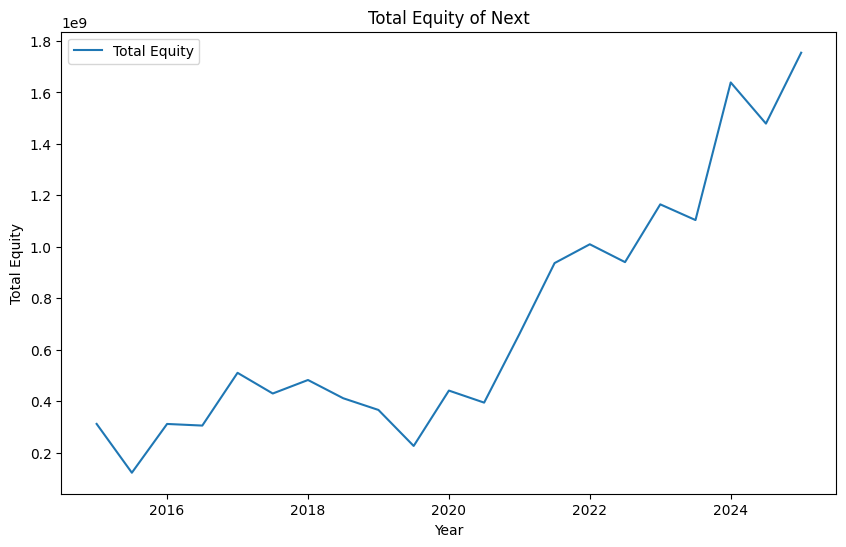

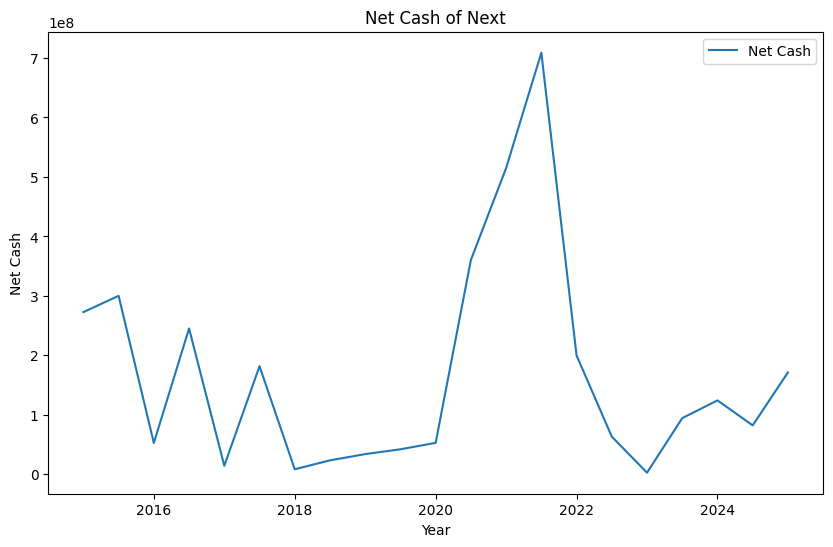

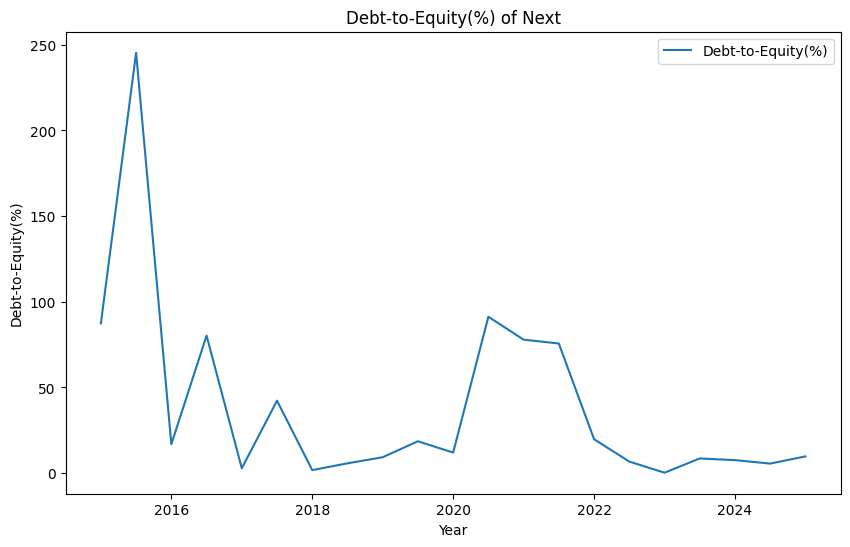

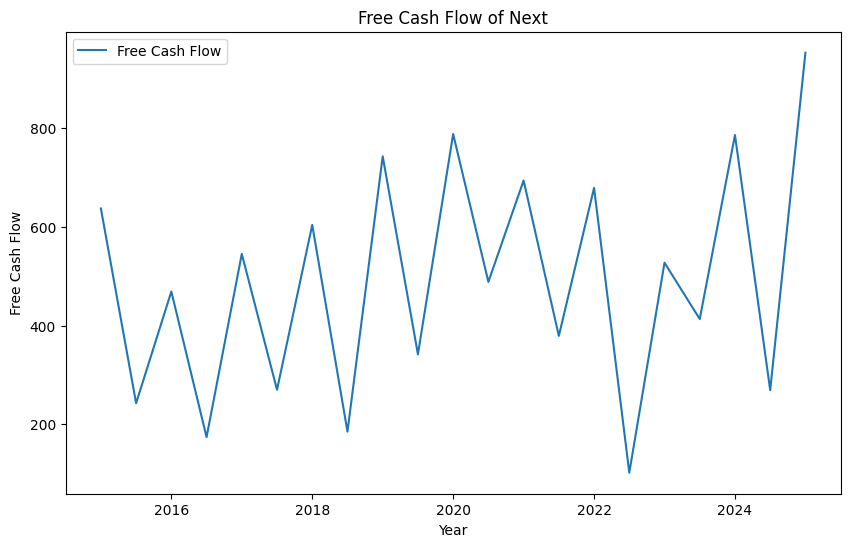

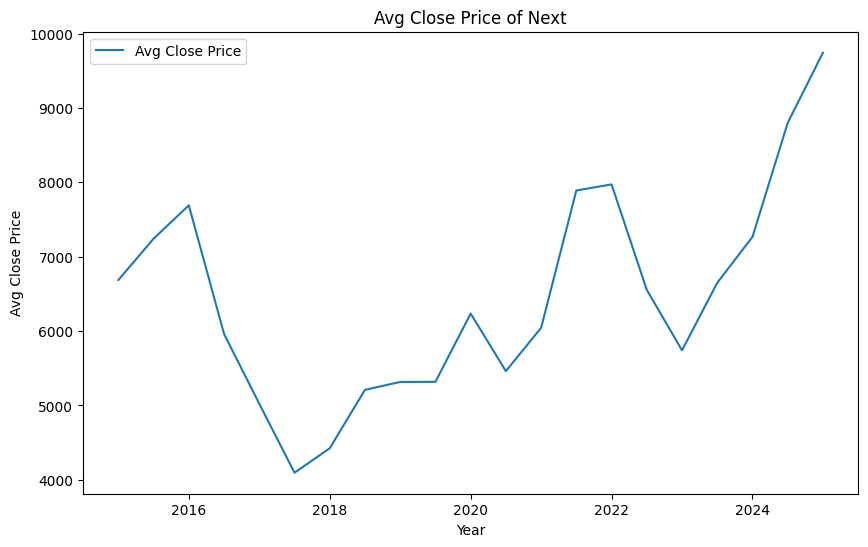

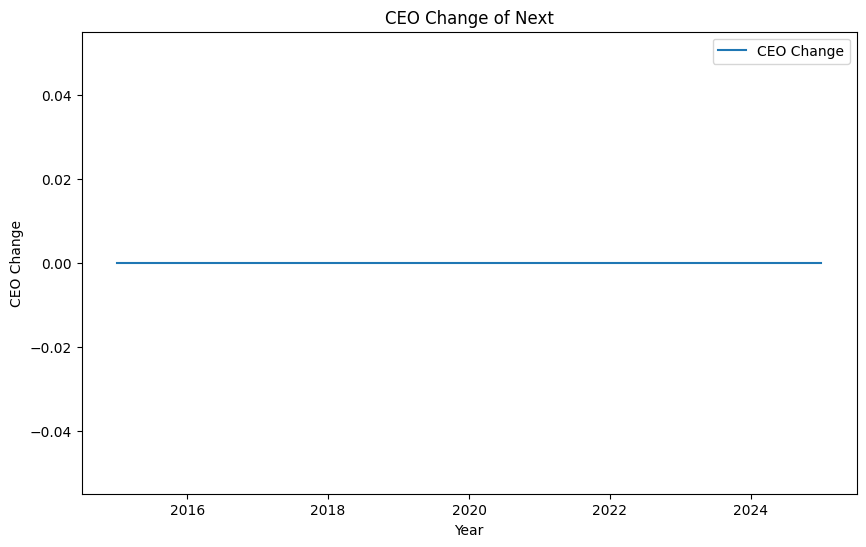

In [34]:
import matplotlib.pyplot as plt
import seaborn as sns
Company = ['Marks & Spencer',
           'JD sports', 
           'Associated British Foods', 
           'Next', 
           'Ocado', 
           'Tesco', 
           "SaintBury's", 
           'King Fisher']
num = 3
for id in Columns:
    if id in Double_Columns:
        continue
    plt.figure(figsize=(10, 6))
    # sns.lineplot(data=Mark, x='Year' , y = id, label=id)
    sns.lineplot(data=Data1[Data1['Company']==Company[num]], x='Year' , y = id, label=id)
    plt.title(id + ' of ' + Company[num])
    plt.xlabel('Year')
    # plt.ylabel('£ million')
    plt.legend()
    
    plt.show()

3-Creating Drivitives beteween half years

In [ ]:
PCT_Columns = [#'Year', 
                'Revenue', 'Operating Profit', #'Operating Margin (%)',
           #'Profit Before Tax ', 
           'Profit After Tax', #'Profit Margin (%)', 'Basic ESP',  'Total Equity', 
           #'Net Cash','Debt-to-Equity(%)', 'Interim Dividend', 
       'Free Cash Flow', 'Avg Close Price',
       'Net From Oprating', 'CapEx', #'Company'
       ]
Drivit_Columns = [#'Year', 
                #'Revenue', 'Operating Profit', #
                'Operating Margin (%)',
           #'Profit Before Tax ', 'Profit After Tax', 
           'Profit Margin (%)', #'Basic ESP',  'Total Equity', 
           #'Net Cash', 
           'Debt-to-Equity(%)', #'Interim Dividend', 
       #'Free Cash Flow', 'Avg Close Price',
       #'Net From Oprating', 'CapEx', #'Company'
]

In [36]:
for id in PCT_Columns:
    Data1[id+'_PCT'] = Data1[id].pct_change() * 100
    Data1[id+'_PCT'] = Data1[id+'_PCT'].clip(upper=150, lower=-150)
    Data1.loc[Data1['Year'] == 2015, id+'_PCT'] = 0
for id in Drivit_Columns:
    Data1[id+'_Dri'] = Data1[id].diff()

In [37]:
Data1.columns

Index(['Year', 'Revenue', 'Operating Profit', 'Operating Margin (%)',
       'Profit Before Tax ', 'Profit After Tax', 'Profit Margin (%)',
       'Basic ESP', 'Total Equity', 'Net Cash', 'Debt-to-Equity(%)',
       'Interim Dividend', 'Free Cash Flow', 'Avg Close Price',
       'Net From Oprating', 'CapEx', 'CEO Change', 'Company', 'Revenue_PCT',
       'Operating Profit_PCT', 'Profit After Tax_PCT', 'Free Cash Flow_PCT',
       'Avg Close Price_PCT', 'Net From Oprating_PCT', 'CapEx_PCT',
       'Operating Margin (%)_Dri', 'Profit Margin (%)_Dri',
       'Debt-to-Equity(%)_Dri'],
      dtype='object')

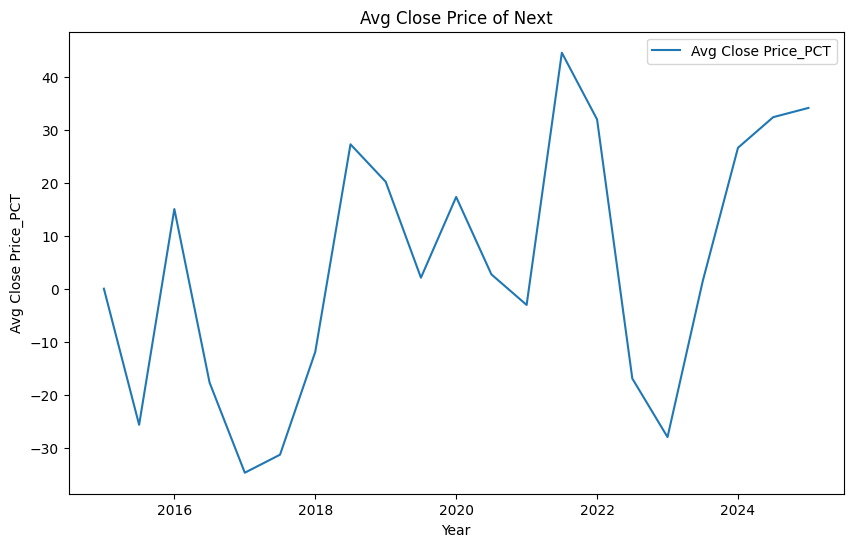

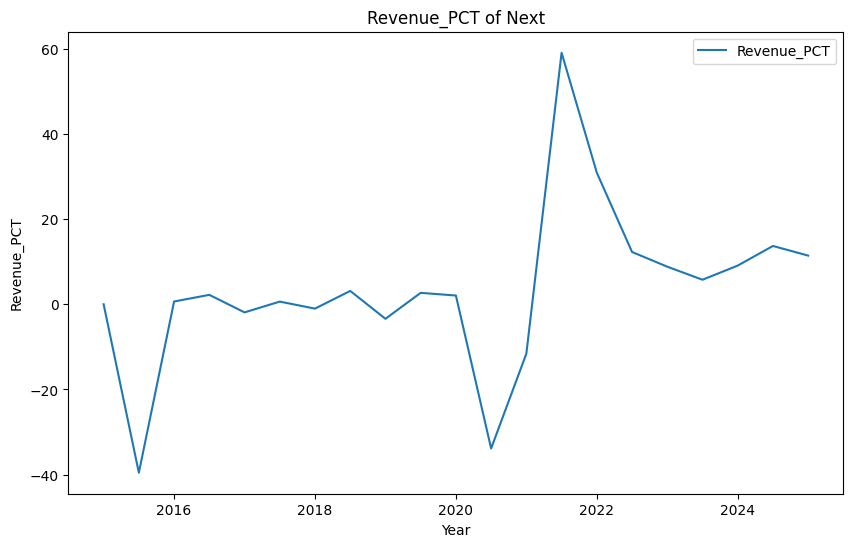

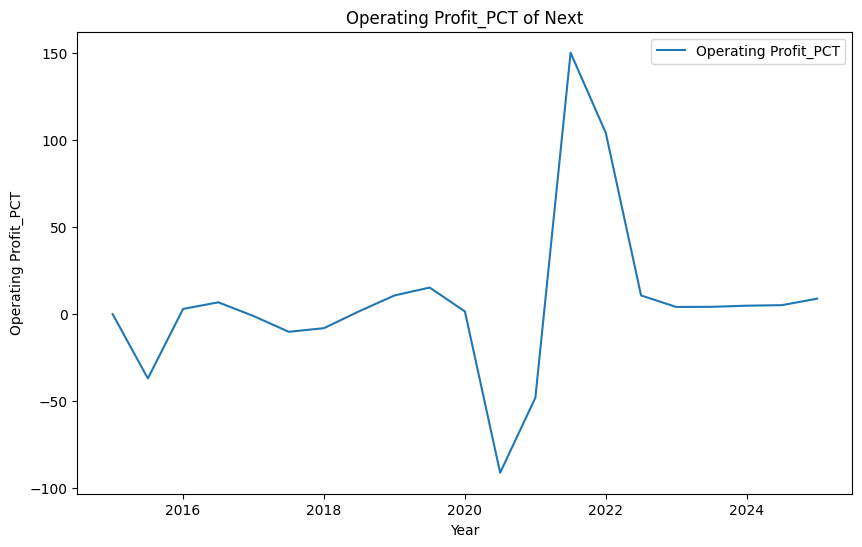

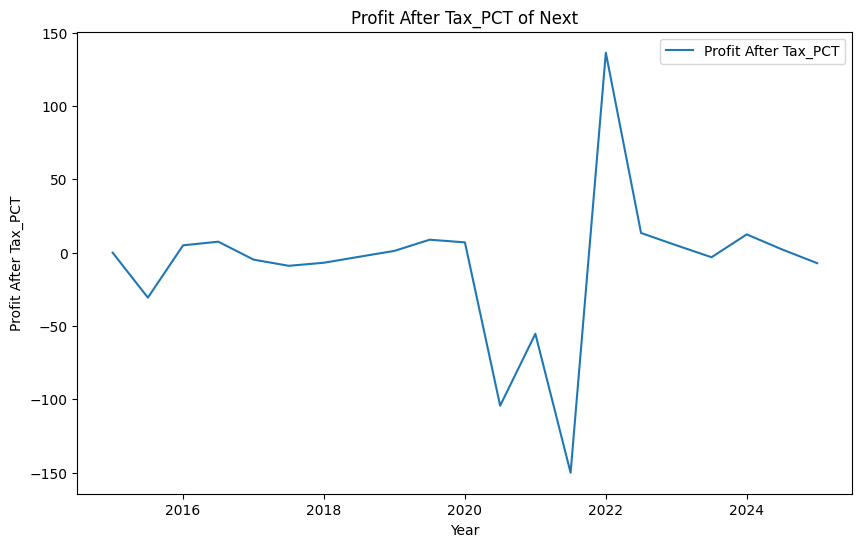

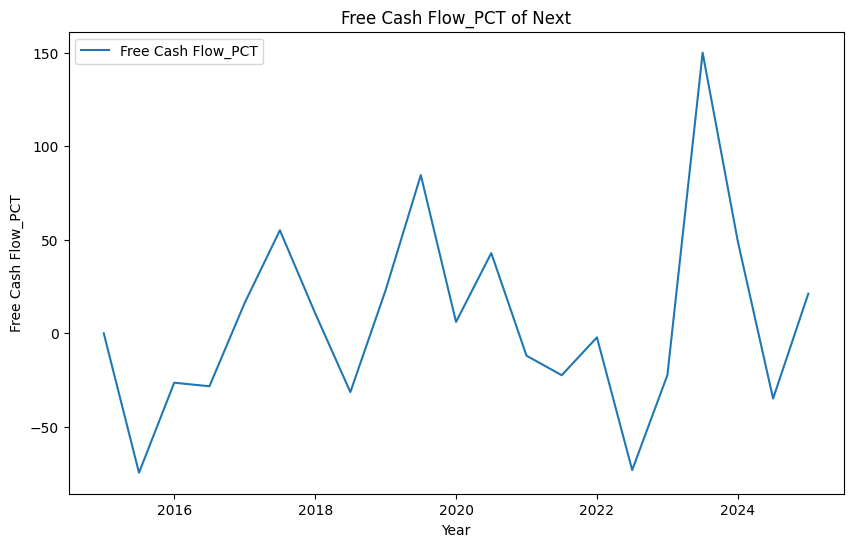

...

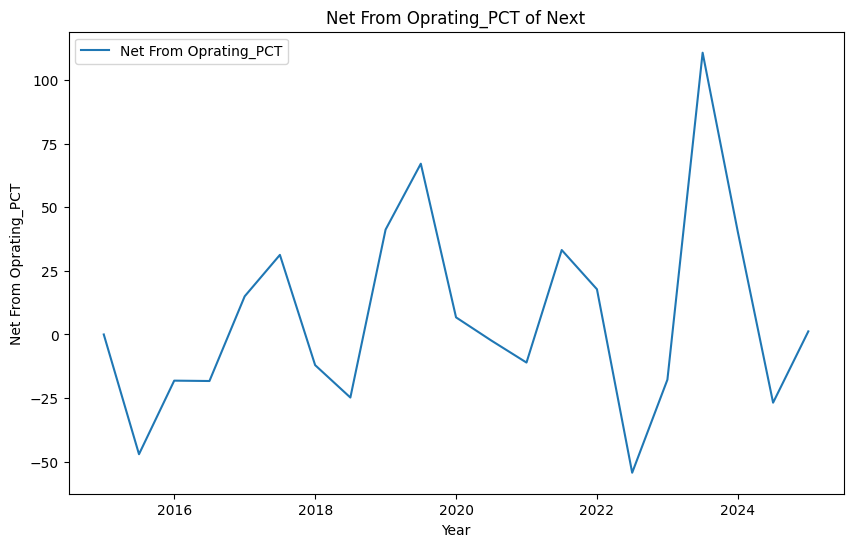

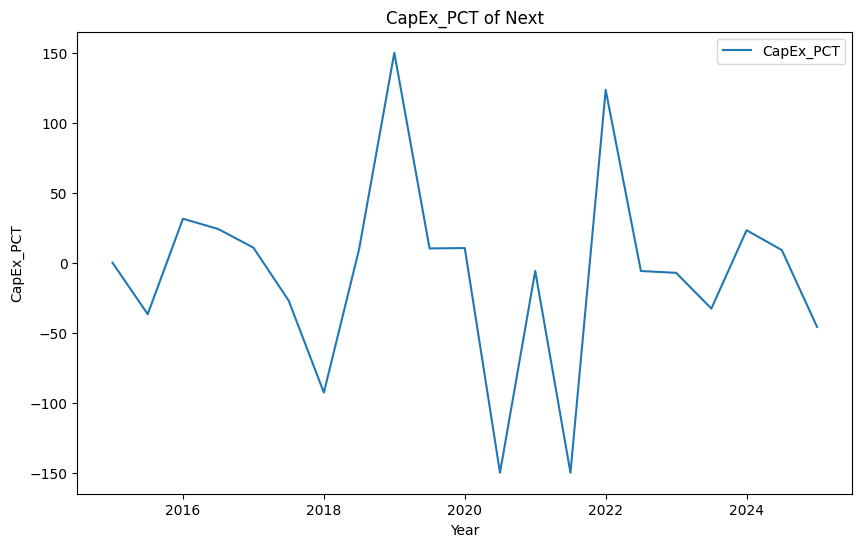

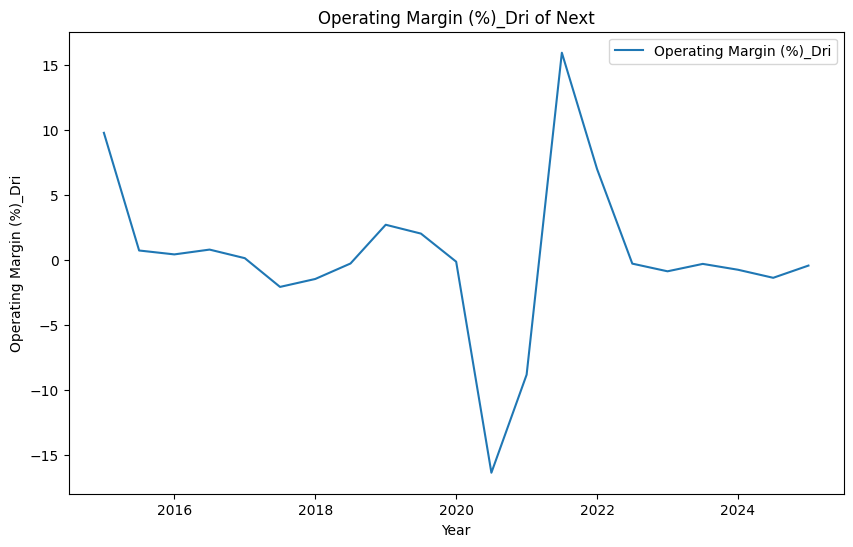

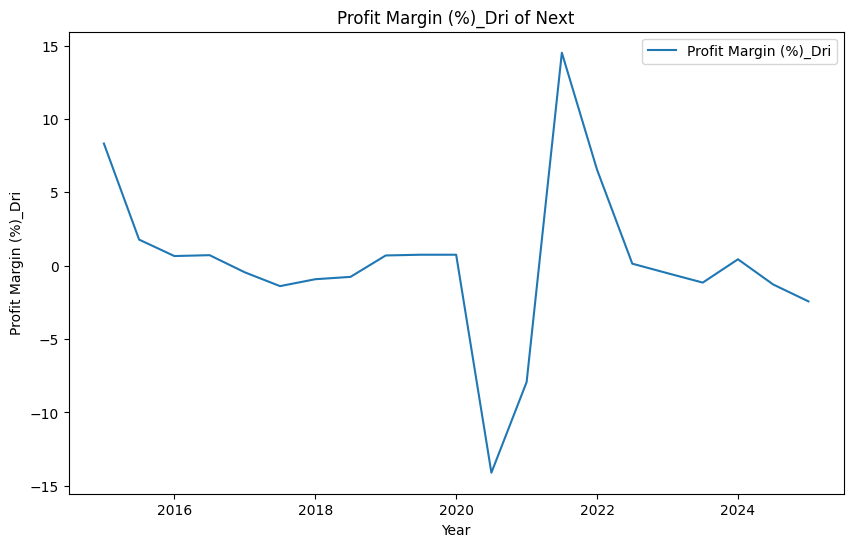

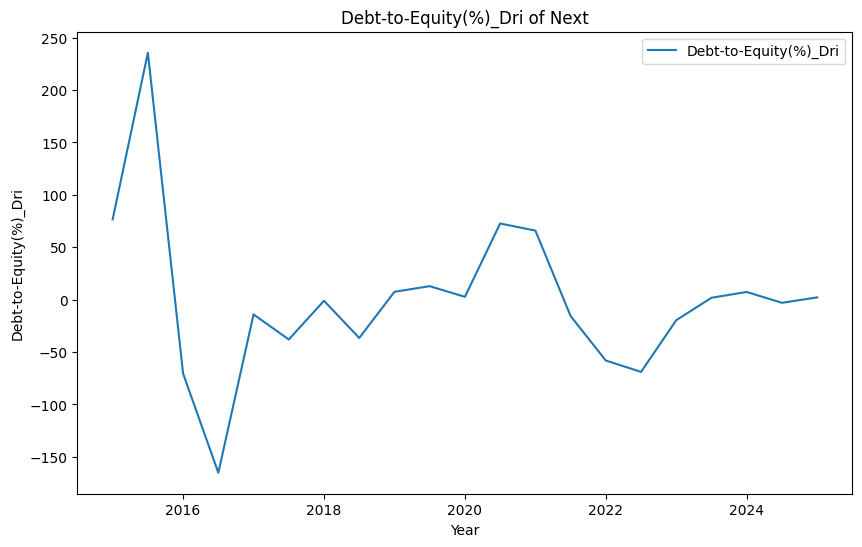

In [38]:
import matplotlib.pyplot as plt
import seaborn as sns
Company = ['Marks & Spencer',
           'JD sports', 
           'Associated British Foods', 
           'Next', 
           'Ocado', 
           'Tesco', 
           "SaintBury's", 
           'King Fisher']
num = 3
plt.figure(figsize=(10, 6))
# sns.lineplot(data=Mark, x='Year' , y = id, label=id)
sns.lineplot(data=Data1[Data1['Company']==Company[num]], x='Year' , y = 'Avg Close Price_PCT', label='Avg Close Price_PCT')
plt.title('Avg Close Price' + ' of ' + Company[num])
plt.xlabel('Year')
# plt.ylabel('£ million')
plt.legend()
    
plt.show()

for id in Data1.columns:
    if 'PCT' not in  id:
        continue
    # else :
        # continue
    plt.figure(figsize=(10, 6))
    # sns.lineplot(data=Mark, x='Year' , y = id, label=id)
    sns.lineplot(data=Data1[Data1['Company']==Company[num]], x='Year' , y = id, label=id)
    plt.title(id + ' of ' + Company[num])
    plt.xlabel('Year')
    # plt.ylabel('£ million')
    plt.legend()
    
    plt.show()

for id in Data1.columns:
    if 'Dri' not in  id:
        continue
    plt.figure(figsize=(10, 6))
    # sns.lineplot(data=Mark, x='Year' , y = id, label=id)
    sns.lineplot(data=Data1[Data1['Company']==Company[num]], x='Year' , y = id, label=id)
    plt.title(id + ' of ' + Company[num])
    plt.xlabel('Year')
    # plt.ylabel('£ million')
    plt.legend()
    
    plt.show()


4-Creating input and output

In [ ]:
Selevted_Columns = [#'Year', 
    'Revenue', 'Operating Profit', #'Operating Margin (%)',
       #'Profit Before Tax ', 
       'Profit After Tax', #'Profit Margin (%)',
       'Basic ESP', 'Total Equity', 'Net Cash',# 'Debt-to-Equity(%)',
       'Interim Dividend', 'Free Cash Flow', #'Avg Close Price',
       #'Net From Oprating', 'CapEx', 'CEO Change', 'Company', 
       'Revenue_PCT',
       'Operating Profit_PCT', 'Profit After Tax_PCT', 'Free Cash Flow_PCT',
       'Net From Oprating_PCT', 'CapEx_PCT', 'Operating Margin (%)_Dri',
       'Profit Margin (%)_Dri', 'Debt-to-Equity(%)_Dri'
       ]
Data2 = Data1[Selevted_Columns].copy()
Out1 = Data1[['Avg Close Price_PCT']].copy()

In [40]:
from ydata_profiling import ProfileReport

profile = ProfileReport(Data2, title="EDA Report", explorative=True)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 17/17 [00:00<?, ?it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Standardzataion

In [41]:
Standard_Columns = [
    'Operating Profit', 
    'Profit After Tax', 
   'Basic ESP', 
   'Net Cash',
   'Interim Dividend', 
   'Free Cash Flow', 
   'Operating Margin (%)_Dri',
    'Profit Margin (%)_Dri', 
    'Debt-to-Equity(%)_Dri'
]
log_Columns = [#'Year',
    'Revenue',
    'Total Equity'
]
PCT_Columns= [#'Year', 
    'Revenue_PCT',
    'Operating Profit_PCT', 
    'Profit After Tax_PCT', 
    'Free Cash Flow_PCT',
    'Net From Oprating_PCT', 
    'CapEx_PCT'
]

In [42]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler
import numpy as np

scaler_standard = StandardScaler()
scaler_minmax_pct  = MinMaxScaler()
scaler_minmax_log = MinMaxScaler() # 
# Make a copy of the selected columns for normalization
Data2 = Data1[Selevted_Columns].copy()
fitted_scalers = {}
# Standardize columns that benefit from mean-std scaling (z-score)
for col in Standard_Columns:
    Data2[col] = scaler_standard.fit_transform(Data2[[col]])
    # Clip extreme values to reduce the effect of outliers
    Data2[col] = Data2[col].clip(upper=3, lower=-3)/3
    
# Apply log transform and then MinMax scaling to columns with large ranges or skewed distributions
for col in log_Columns:
    Data2[col] = np.log1p(Data2[col])  # log(1+x) to handle zeros
    Data2[col] = scaler_minmax_log.fit_transform(Data2[[col]])
    
# MinMax scale percentage change columns to [0, 1] range
for col in PCT_Columns:
    Data2[col] = scaler_minmax_pct.fit_transform(Data2[[col]])

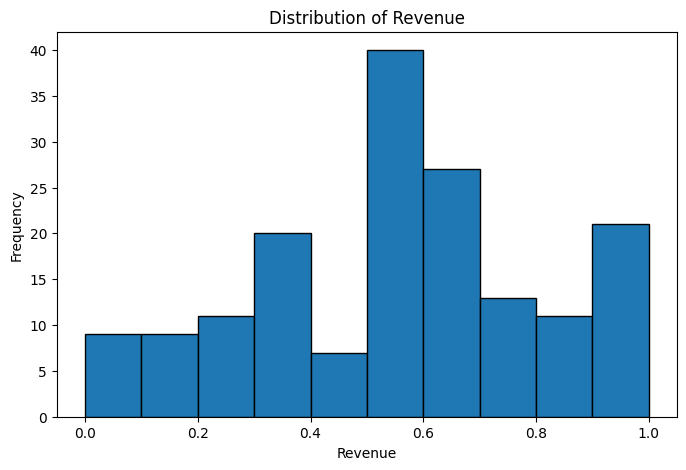

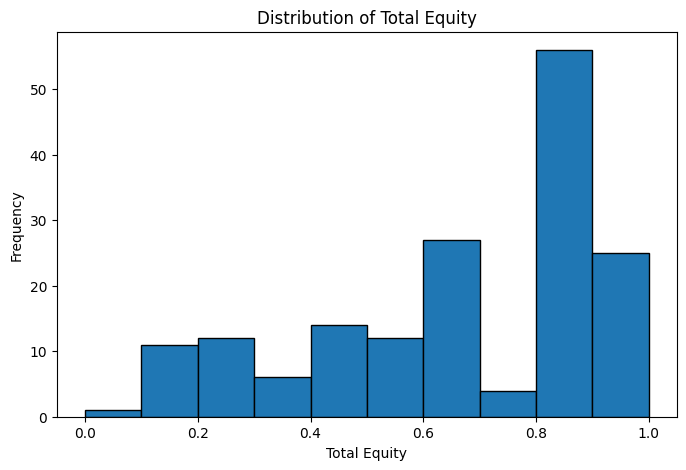

In [43]:
for col in log_Columns:#PCT_Columns:#Standard_Columns: 
    plt.figure(figsize=(8, 5))
    plt.hist(Data2[col], edgecolor='black')
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

Output

In [44]:
def classify_price_change(pct):
    # if pct <= -20:
        # return 0  # Large Drop
    # el
    if pct < 0:
        # return 1  # Small Drop
        return 0
    # elif pct < 20:
        # return 2  # Small Rise
    else:
        # return 3  # Large Rise
        return 1

Out1 = Data1['Avg Close Price_PCT'].apply(classify_price_change)

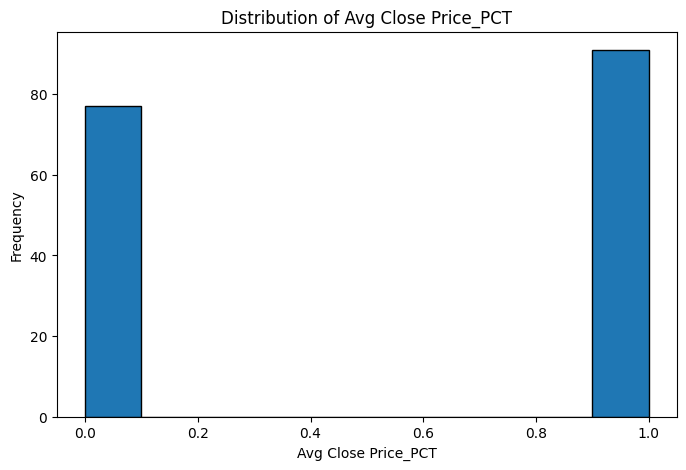

In [45]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 5))
plt.hist(Out1, edgecolor='black')
plt.title('Distribution of Avg Close Price_PCT')
plt.xlabel('Avg Close Price_PCT')
plt.ylabel('Frequency')
plt.show()

In [46]:
def classify_price_change1(pct):
    if pct < 0:
        return False
    else:
        return True
Out1 = Data1['Avg Close Price_PCT'].apply(classify_price_change1)

Modeling

In [47]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score
#
Colmn = [
    'Revenue', 
    'Operating Profit',
    #    'Profit After Tax', 
       'Basic ESP',
        #  'Total Equity',
         'Net Cash',
    #    'Interim Dividend', 
       'Free Cash Flow',
       'Revenue_PCT',
       'Operating Profit_PCT', 
      #  'Profit After Tax_PCT', 
       'Free Cash Flow_PCT',
       'Net From Oprating_PCT', 
       'CapEx_PCT', 
       'Operating Margin (%)_Dri',
       'Profit Margin (%)_Dri',
         'Debt-to-Equity(%)_Dri'
       ]
# Prepare input and output
X = Data1[Colmn]
y = Data1['Avg Close Price_PCT'].apply(classify_price_change1)  # use class labels
# X = X.dropna()
# y = y.loc[X.index] if hasattr(y, 'loc') else y[X.index]

split / Stadardaize

In [48]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

scaler_standard = StandardScaler()
scaler_minmax_pct  = MinMaxScaler()
scaler_minmax_log = MinMaxScaler() # 

for col in Standard_Columns:
    if col not in Colmn: continue
    scaler_standard.fit(X_test[[col]])
    X_test[col] = scaler_standard.transform(X_test[[col]])
    X_test[col] = X_test[col].clip(upper=3, lower=-3) / 3

for col in log_Columns:
    if col not in Colmn: continue
    X_test[col] = np.log1p(X_test[col])
    scaler_minmax_log.fit(X_test[[col]])
    X_test[col] = scaler_minmax_log.transform(X_test[[col]])

for col in PCT_Columns:
    if col not in Colmn: continue
    scaler_minmax_pct.fit(X_test[[col]])
    X_test[col] = scaler_minmax_pct.transform(X_test[[col]])



X_test = X_test.dropna()
# Align y_test with the (potentially reduced) X_test index
y_test = y_test.loc[X_test.index] if hasattr(y_test, 'loc') else y[X_test.index]

X_train= X_train.dropna()
# Align y_train with the (potentially reduced) X_train index
y_train = y_train.loc[X_train.index] if hasattr(y_train, 'loc') else y[X_train.index]

In [ ]:
# Train a simple classifier
clf = RandomForestClassifier(random_state=42)
clf.fit(X_train, y_train)

# Predict and evaluate
y_pred = clf.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred, target_names=['Drop', 'Rise']))

Accuracy: 0.6176470588235294
              precision    recall  f1-score   support

        Drop       0.57      1.00      0.72        17
        Rise       1.00      0.24      0.38        17

    accuracy                           0.62        34
   macro avg       0.78      0.62      0.55        34
weighted avg       0.78      0.62      0.55        34



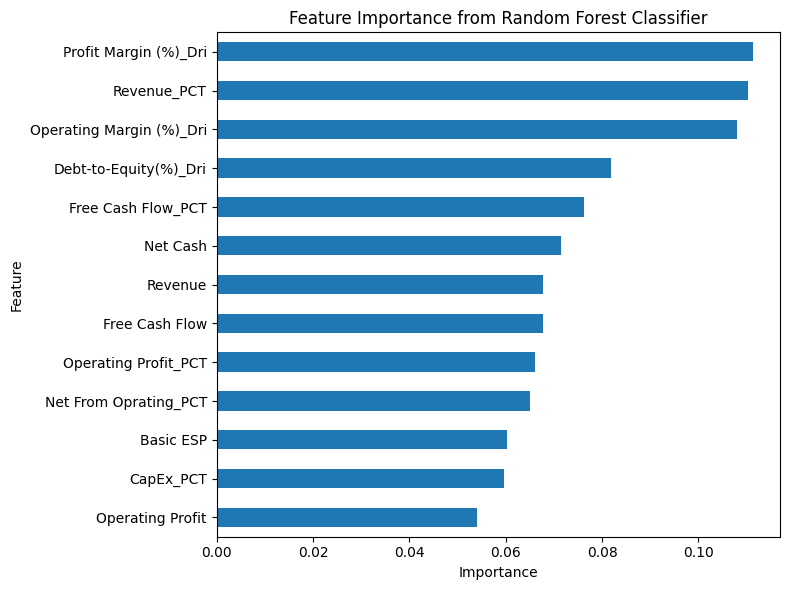

In [ ]:
importances = clf.feature_importances_

feature_names = Colmn
feature_importance_series = pd.Series(importances, index=feature_names)

# Sort the features by importance in descending order
sorted_importance = feature_importance_series.sort_values(ascending=True)

# Plotting the feature importance
plt.figure(figsize=(8, 6))
sorted_importance.plot(kind='barh')
plt.title('Feature Importance from Random Forest Classifier')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.tight_layout() # Adjust layout to prevent labels from overlapping
plt.show() 

In [52]:
# --- Define the Prediction Function for Gradio (takes original values) ---
def predict_stock_trend(*features_raw):
    input_df = pd.DataFrame([features_raw], columns=X.columns)
    # Standard Scaling
    for col in Standard_Columns:
        if col not in Colmn: continue
        input_df[col] = scaler_standard.transform(input_df[[col]])
        input_df[col] = input_df[col].clip(upper=3, lower=-3) / 3
    for col in log_Columns:
        if col not in Colmn: continue
        input_df[col] = np.log1p(input_df[col])
        input_df[col] = scaler_minmax_log.transform(input_df[[col]])
    for col in PCT_Columns:
        if col not in Colmn: continue
        input_df[col] = scaler_minmax_pct.transform(input_df[[col]])

    # Make prediction using the normalized input
    prediction = clf.predict(input_df)[0]
    probabilities = clf.predict_proba(input_df)[0] # Get probabilities for the single input


    # Map numerical prediction to 'Drop' or 'Rise'
     # Map numerical prediction to 'Drop' or 'Rise' and get the corresponding probability
    if prediction == 0:
        predicted_label = "Drop"
        confidence = probabilities[0] # Probability of 'Drop'
    else:
        predicted_label = "Rise"
        confidence = probabilities[1]
    
    return predicted_label, f"{confidence:.4f}" 
    # Format probability to 4 decimal places


In [53]:
X.head()

,Revenue,Operating Profit,Basic ESP,Net Cash,Free Cash Flow,Revenue_PCT,Operating Profit_PCT,Free Cash Flow_PCT,Net From Oprating_PCT,CapEx_PCT,Operating Margin (%)_Dri,Profit Margin (%)_Dri,Debt-to-Equity(%)_Dri
0,10311400000,701300000,29.7,187800000,628.9,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN
1,10555400000,584100000,24.9,196000000,635.9,2.366313,-16.711821,1.113055,-5.164319,-11.246341,-1.27,-0.84,-0.18
2,10622000000,253200000,7.2,406200000,695.7,0.630957,-56.651258,9.403994,-11.905941,-35.427877,-3.15,-2.74,7.20
3,10698200000,156500000,1.6,171000000,533.5,0.717379,-38.191153,-23.314647,-20.408354,-14.973118,-0.92,-0.82,-7.10
4,10400000000,298100000,2.5,213100000,856.7,-2.787385,90.479233,60.581068,46.469758,22.668353,1.41,0.17,2.84


In [ ]:
import gradio as gr
# --- 5. Create the Gradio Interface ---
# We'll create input components for each feature (based on X.shape[1])
# and a Textbox for the output.
num_features = X_test.shape[1] 
input_components = [
    # CORRECTED LINE: Use .iloc for integer-location based indexing
    gr.Number(label=Colmn[i], value=X.iloc[1][Colmn[i]]) # Pre-fill with a sample value
    for i in range(num_features)
]

output_components = [
    gr.Textbox(label="Predicted Stock Trend"),
    gr.Textbox(label="Prediction Probability") # Using Textbox for formatted string
]

# Launch the Gradio interface
iface = gr.Interface(
    fn=predict_stock_trend,
    inputs=input_components,
    outputs=output_components, # Updated to a list of outputs
    title="Stock Trend Prediction with Random Forest (Original Inputs & Probability)",
    description="Enter the original values for the features to predict if the stock price will 'Drop' or 'Rise'. "
                "Inputs are normalized internally before prediction. The probability of the predicted outcome is also shown.",
    allow_flagging="never"
)

iface.launch()

c:\Users\Ehsan\AppData\Local\Programs\Python\Python310\lib\site-packages\gradio\interface.py:425: UserWarning: The `allow_flagging` parameter in `Interface` is deprecated.Use `flagging_mode` instead.
  warnings.warn(


* Running on local URL:  http://127.0.0.1:7860
* To create a public link, set `share=True` in `launch()`.


Adding Fste 100 index to the model

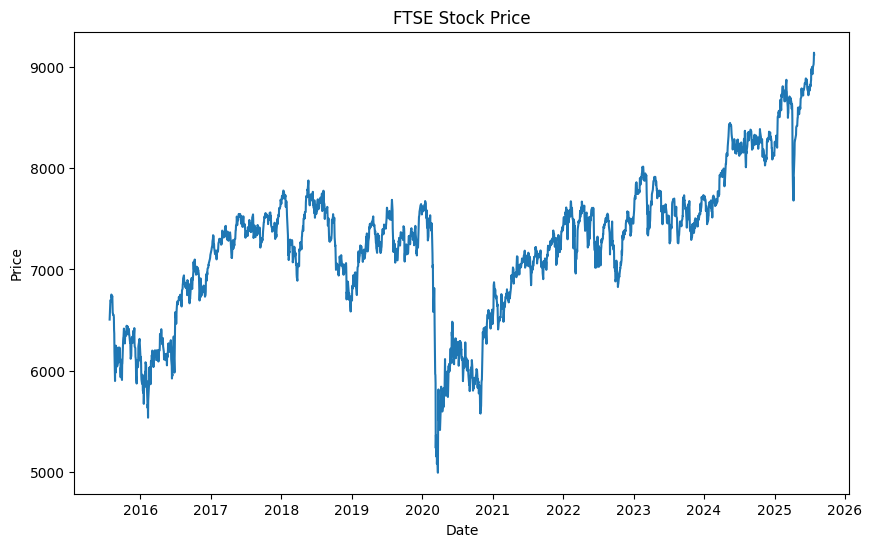

In [ ]:
from datetime import datetime
import yfinance as yf


import matplotlib.pyplot as plt
plt.figure(figsize=(10, 6))
plt.plot(data['Close'])
plt.title('FTSE Stock Price')
plt.xlabel('Date')
plt.ylabel('Price')
plt.show()

In [56]:
import pandas as pd
from sklearn.preprocessing import StandardScaler, MinMaxScaler
import numpy as np

scaler1 = MinMaxScaler()
path = 'https://raw.githubusercontent.com/ehsanh123/stock_market_prediction/main/Part4/Financial%20Repors/All%20Ficnal%20data.xlsx'

excel_file = pd.ExcelFile(path)
Comapnies = excel_file.sheet_names
Stok = {}

for i in Comapnies:
    Stok[i] = pd.read_excel(excel_file, sheet_name=i)
    Stok[i]['Company']=i
    Stok[i].set_index('Year', inplace=True)
    Stok[i].sort_index(inplace=True)
    Stok[i].reset_index(inplace=True)

    Stok[i]['Avg Close Price'] = scaler1.fit_transform(
            Stok[i]['Avg Close Price'].values.reshape(-1, 1) )

# Mark1 = pd.read_excel(excel_file, sheet_name='Marks & Spencer')
# Mark1.set_index('Year', inplace=True)
# Mark1.sort_index(inplace=True)

ftse = yf.Ticker("^FTSE")
data = ftse.history(period="10y", interval='3mo', end='2025-01-01', start = '2015-01-01')

data['Close'] = scaler1.fit_transform(data['Close'].values.reshape(-1, 1))


In [57]:
# Stok["Marks & Spencer"]
data['year'] = data.index.year
data['Month'] =  data.index.month
data['Year'] = data['year'].astype(str)+'.'+data['Month'].astype(str)


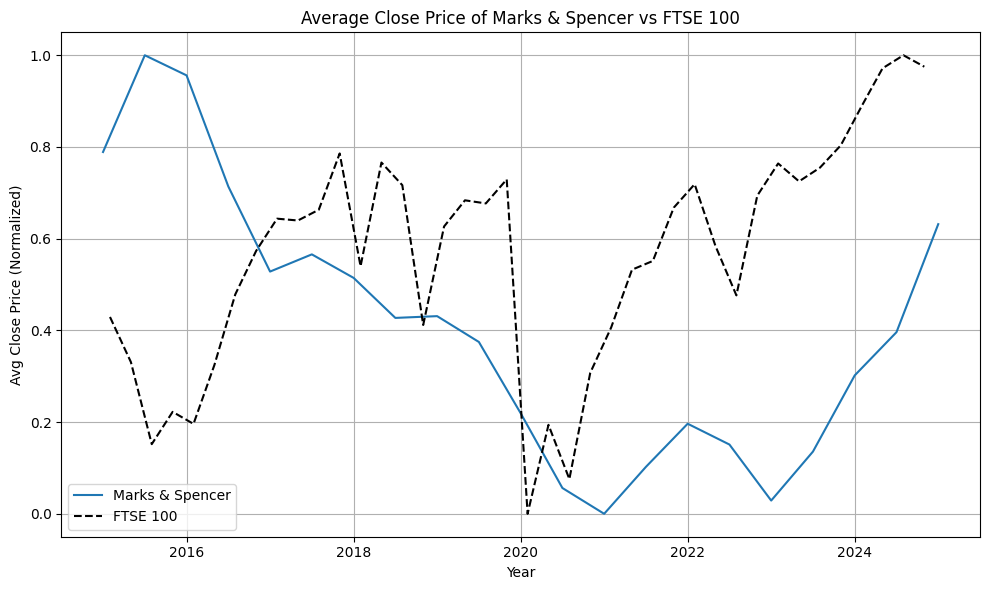

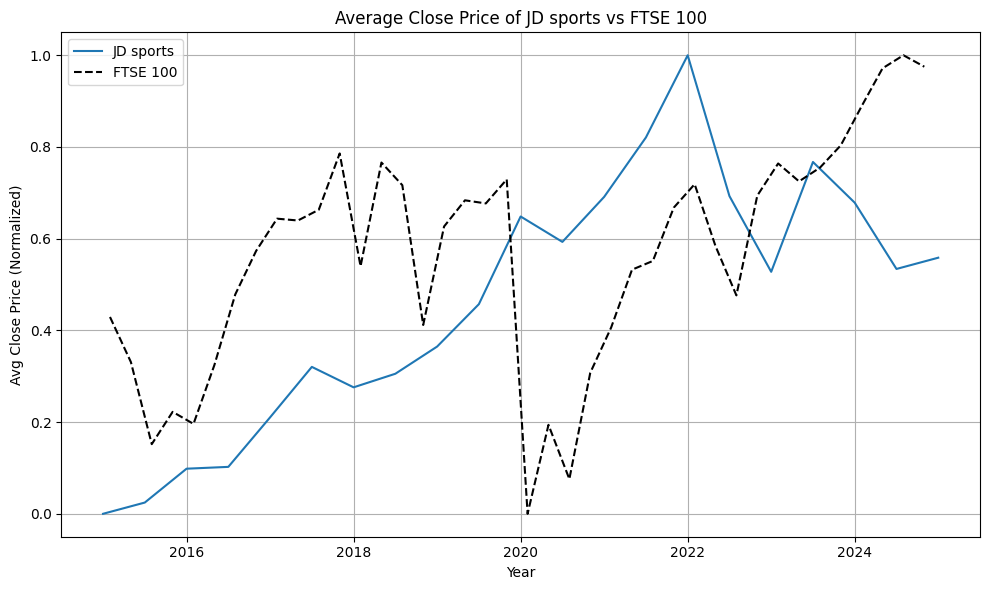

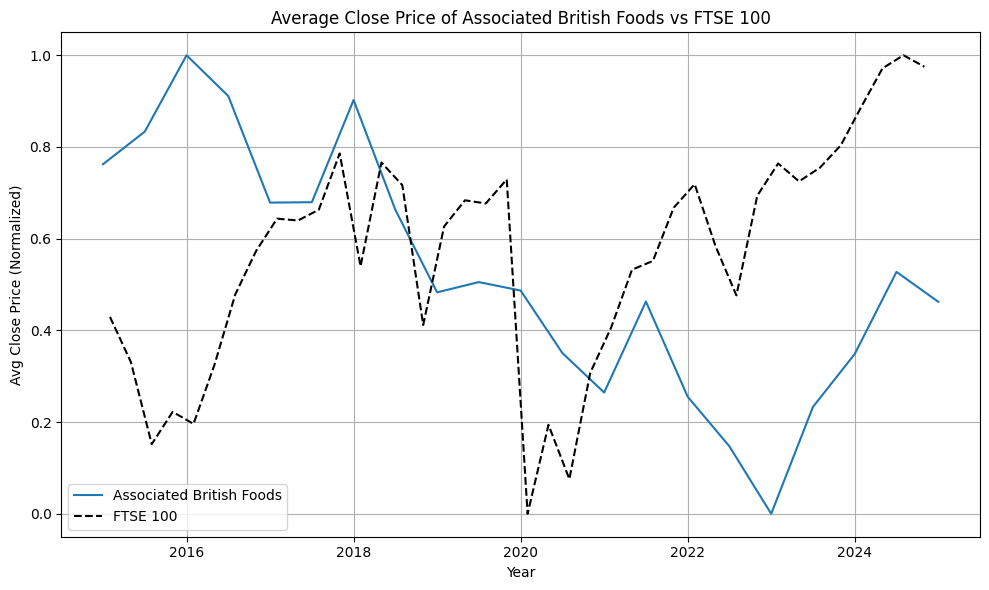

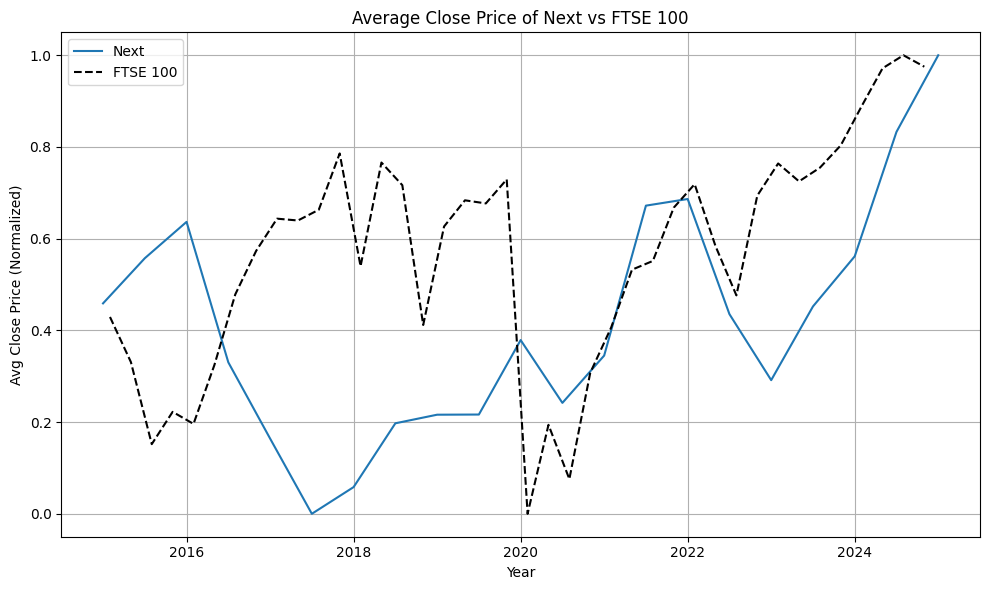

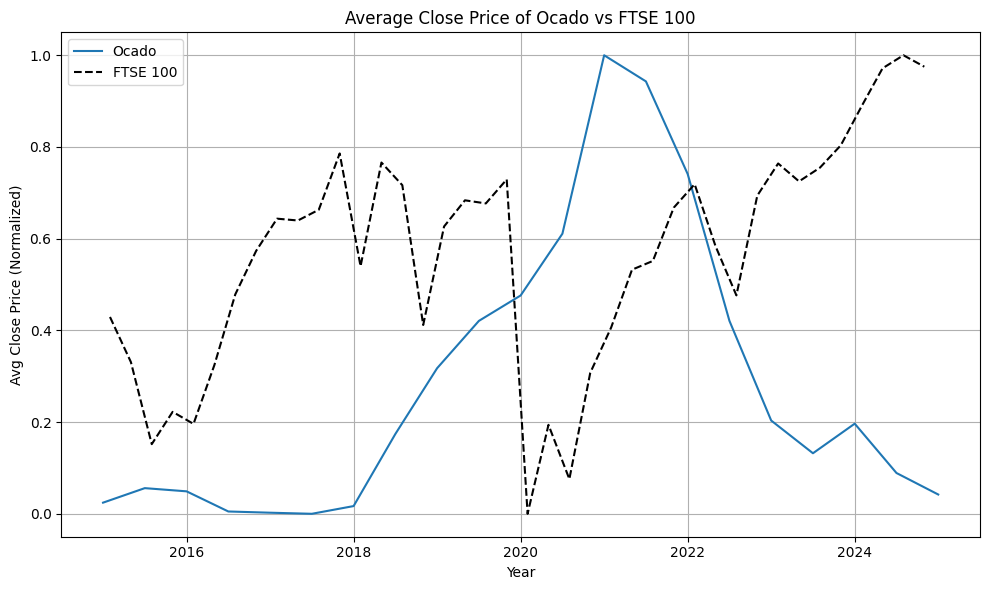

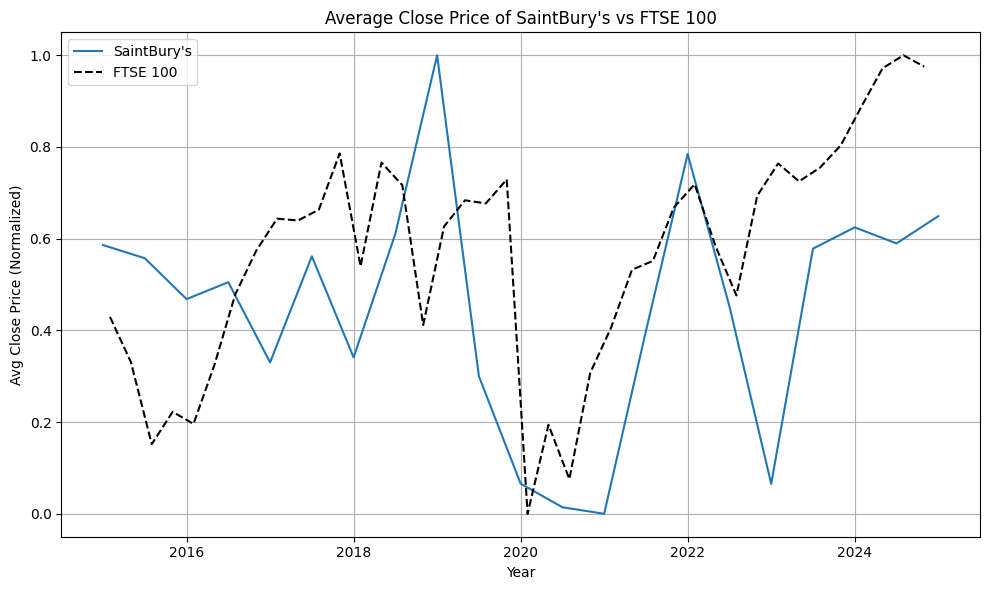

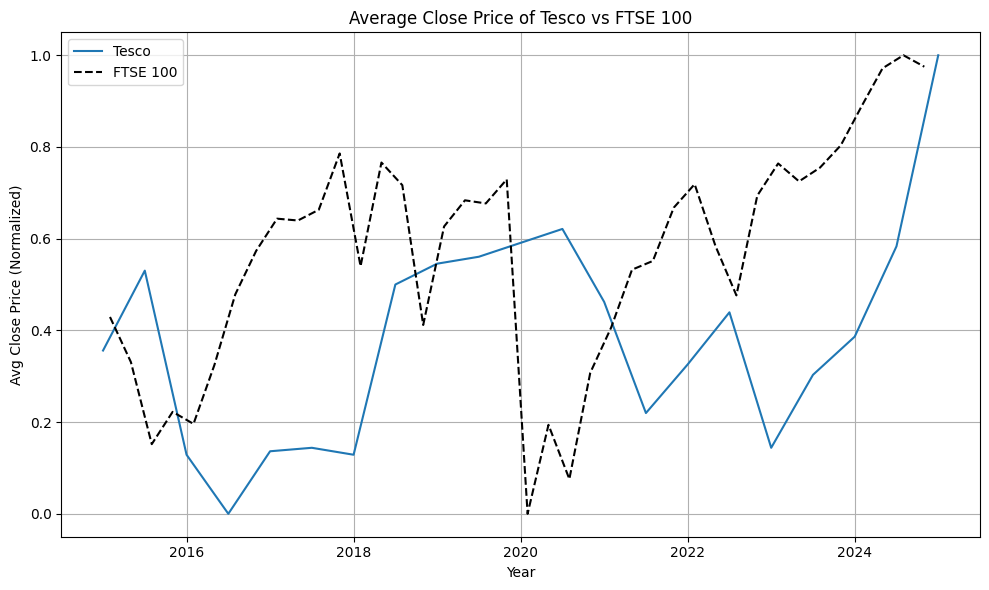

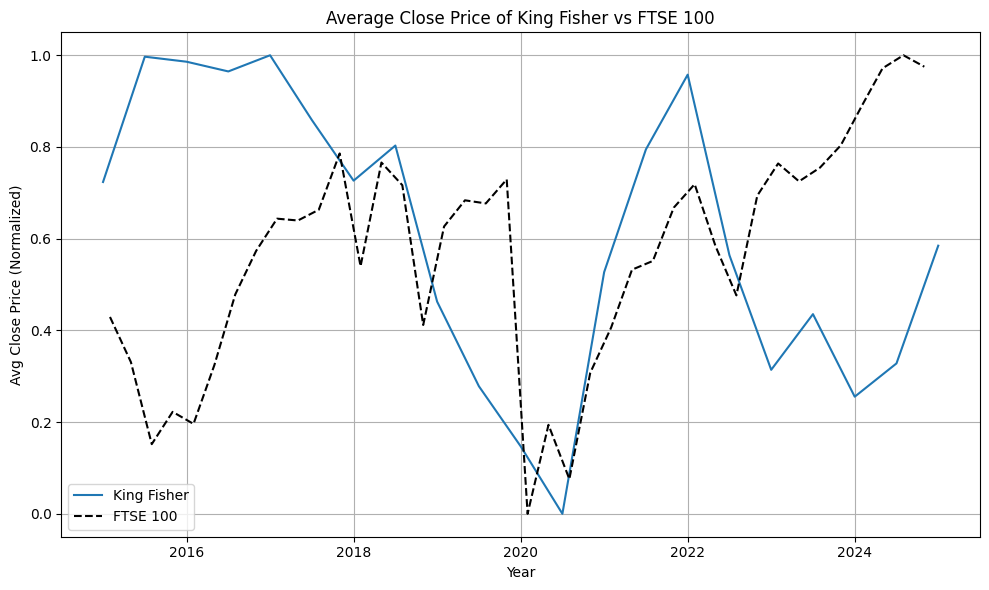

In [58]:
import matplotlib.pyplot as plt

# Create float-based Year for FTSE
data['Year'] = data.index.year + data.index.month / 12  # e.g., 2022.25

for i in Stok:
    df = Stok[i].copy()

    # Convert company's 'Year' to float if it's not already
    if 'Month' in df.columns:
        df['Year'] = df['Year'] + df['Month'] / 12
    else:
        df['Year'] = df['Year'].astype(float)  # assuming 'Year' is already numeric

    plt.figure(figsize=(10, 6))
    
    # Plot company's Avg Close Price
    if 'Avg Close Price' in df.columns:
        plt.plot(df['Year'], df['Avg Close Price'], label=i)

    # Plot FTSE on same chart
    plt.plot(data['Year'], data['Close'], label='FTSE 100', color='black', linestyle='--')

    plt.title(f'Average Close Price of {i} vs FTSE 100')
    plt.xlabel('Year')
    plt.ylabel('Avg Close Price (Normalized)')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


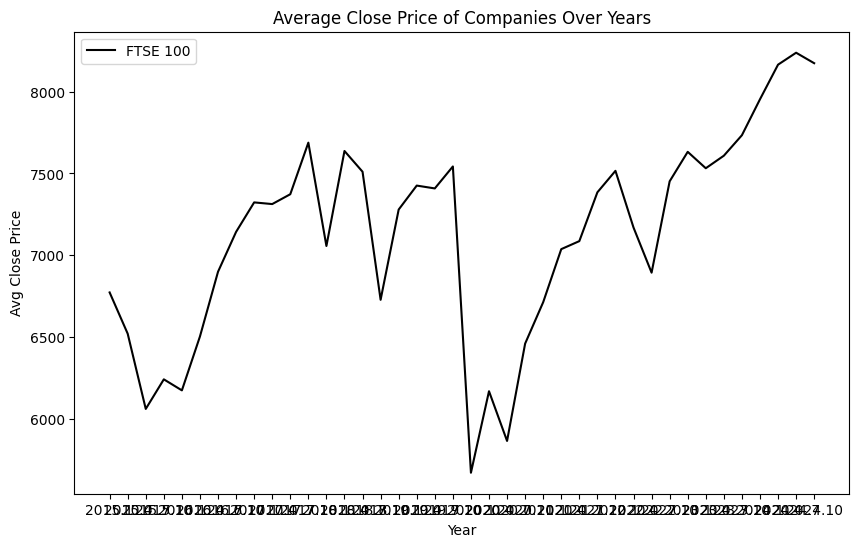

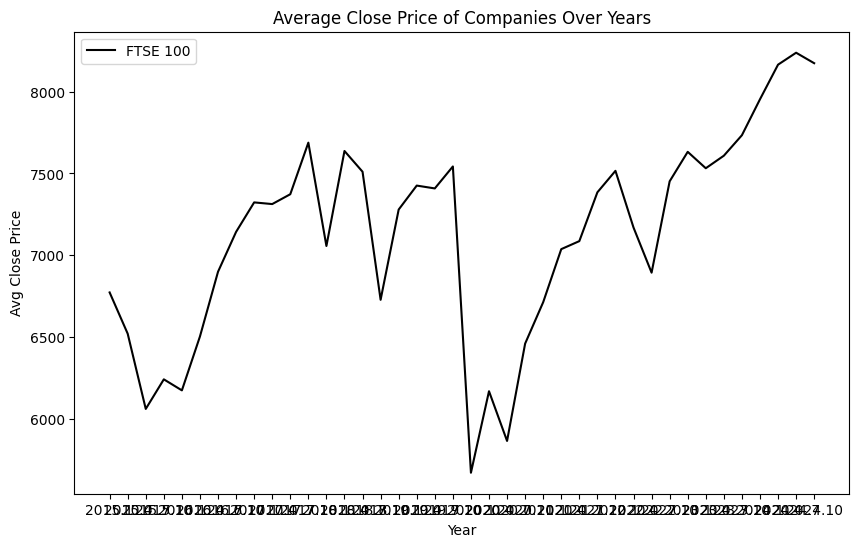

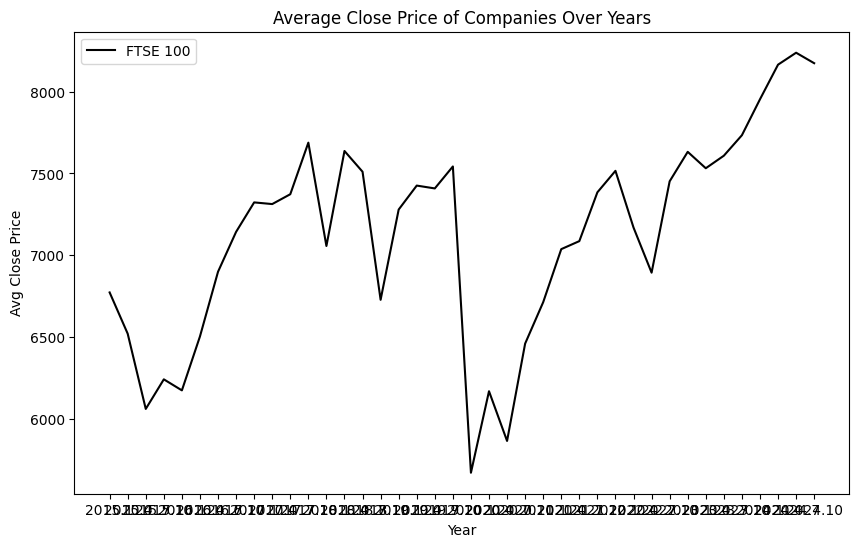

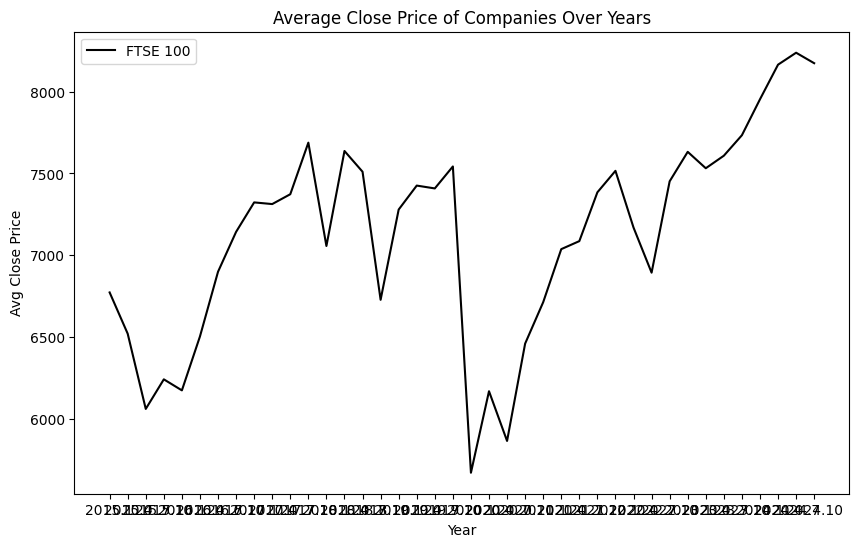

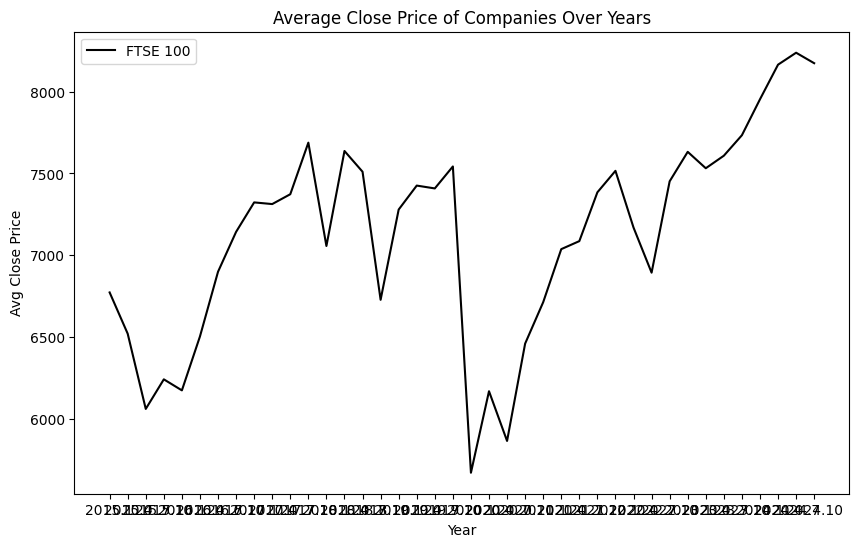

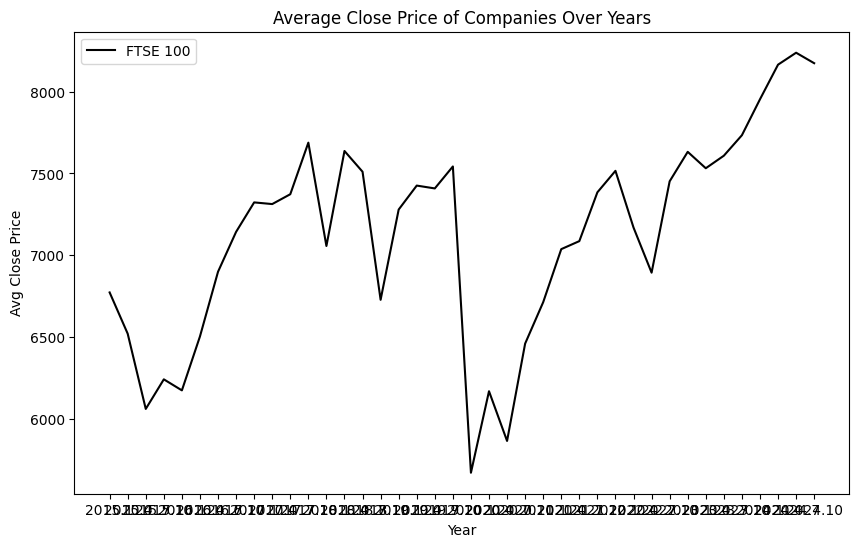

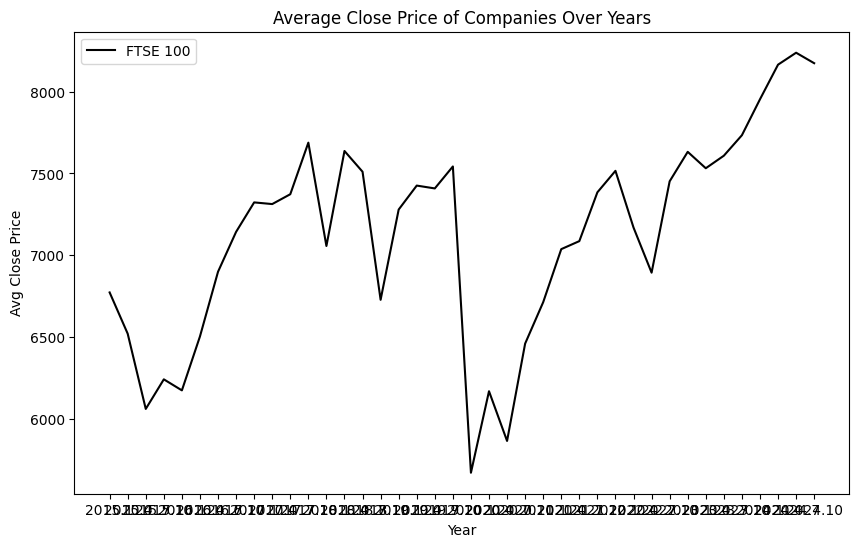

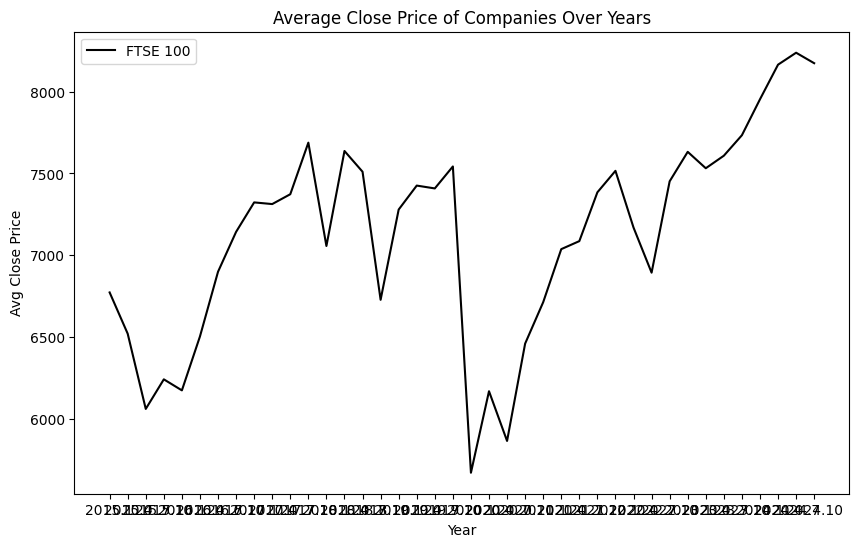

In [54]:
# Mark1 = pd.read_excel(excel_file, sheet_name='Marks & Spencer')
# Mark1.set_index('Year', inplace=True)
# Mark1.sort_index(inplace=True)
# plt.figure(figsize=(10, 6))
# plt.plot(Mark1['Avg Close Price'], label='Avg Close Price')
# plt.title('Marks & Spencer Avg Close Price Over Years')
# plt.xlabel('Year')
# plt.ylabel('Avg Close Price')
# plt.legend()
# plt.show()

# plt.figure(figsize=(10, 6))
# plt.plot(data['Close'])
# plt.title('FTSE Stock Price')
# plt.xlabel('Date')
# plt.ylabel('Price')
# plt.show()



for i in Stok:
    plt.figure(figsize=(10, 6))
    # plt.plot(Stok[i]['Year'] , Stok[i]['Avg Close Price'], label=i)

# plt.plot(data['Close'], label='FTSE 100', color='black', linestyle='--')
    plt.title('Average Close Price of Companies Over Years')
    plt.plot(data['Year'],data['Close'],label='FTSE 100', color='black')
    # plt.title('FTSE Stock Price')
    plt.xlabel('Year')
    plt.ylabel('Avg Close Price')
    plt.legend()
    plt.show()


In [16]:
Mark1.head(20)

,Revenue,Operating Profit,Operating Margin (%),Profit Before Tax,Profit After Tax,Profit Margin (%),Basic ESP,Total Equity,Net Cash,Debt-to-Equity(%),Interim Dividend,Free Cash Flow,Avg Close Price,Net From Oprating,CapEx,CEO Change
Year,,,,,,,,,,,,,,,,
2015.0,10311400000,701300000,6.80,600000000,481700000,4.67,29.7,3198400000,187800000,5.87,18.0,628.9,417.14,1278.0,649.1,0
2016.0,10555400000,584100000,5.53,488800000,404400000,3.83,24.9,3443000000,196000000,5.69,18.7,635.9,482.17,1212.0,576.1,0
2017.0,10622000000,253200000,2.38,176400000,115700000,1.09,7.2,3150400000,406200000,12.89,18.7,695.7,315.70,1067.7,372.0,0
2018.0,10698200000,156500000,1.46,66800000,29100000,0.27,1.6,2954000000,171000000,5.79,18.7,533.5,310.35,849.8,316.3,0
2019.0,10400000000,298100000,2.87,84200000,45300000,0.44,2.5,2469000000,213100000,8.63,18.7,856.7,277.88,1244.7,388.0,0
2020.0,10200000000,254800000,2.50,67200000,27400000,0.27,1.3,3708500000,164100000,4.42,10.7,207.4,195.53,973.1,765.7,0
2021.0,9155700000,-30700000,-0.34,-209400000,-201200000,-2.20,-10.1,2285800000,669700000,29.30,0.0,678.3,110.17,870.9,192.6,0
2022.0,10885100000,572200000,5.26,391700000,309000000,2.84,15.7,2917000000,1197900000,41.07,0.0,1132.3,186.59,1378.0,245.7,0
2023.0,11931300000,515100000,4.32,475700000,364500000,3.05,18.5,2680800000,1067900000,39.84,0.0,513.3,121.40,1029.9,516.6,0
